In [2]:
import os
import cv2
import gdown
import shutil
import random
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import keras_tuner as kt
from keras.models import Model
from keras.models import Sequential, load_model
from keras.applications import VGG16
from keras.optimizers import Adam, RMSprop, SGD
from keras.utils import image_dataset_from_directory
from keras.layers import Input, Flatten, Dense, Dropout
from keras.callbacks import ModelCheckpoint, EarlyStopping
from sklearn.metrics import confusion_matrix, classification_report

## Downloading Datasets

### Folder Images

### List Attribute

In [3]:
list_attribute_url = 'https://drive.google.com/file/d/1Q0kgTKibawWFUX5zTLaVUP0NJs9dcVDt/view?usp=drive_link'
gdown.download(list_attribute_url, fuzzy=True)

Downloading...
From: https://drive.google.com/uc?id=1Q0kgTKibawWFUX5zTLaVUP0NJs9dcVDt
To: D:\nitip adit\Bootcamp\Project_1\gender-classification-based-on-face-recognition\list_attribute.txt
100%|█████████████████████████████████████████████████████████████████████████████| 26.7M/26.7M [00:12<00:00, 2.07MB/s]


'list_attribute.txt'

## Splitting Dataset

In [48]:
attribute_list_df = pd.read_csv('list_attribute.txt', sep='\s+', skiprows=1, usecols=['Male'])
attribute_list_df.index.name = 'filename'
attribute_list_df.replace(to_replace=-1, value=0, inplace=True)
attribute_list_df.rename(columns={"Male": "Gender"}, inplace=True)
attribute_list_df

,Gender
filename,
000001.jpg,0
000002.jpg,0
000003.jpg,1
000004.jpg,0
000005.jpg,0
...,...
202595.jpg,0
202596.jpg,1
202597.jpg,1


In [49]:
attribute_list_df.reset_index(drop=False, inplace=True)

In [50]:
attribute_list_df

,filename,Gender
0,000001.jpg,0
1,000002.jpg,0
2,000003.jpg,1
3,000004.jpg,0
4,000005.jpg,0
...,...,...
202594,202595.jpg,0
202595,202596.jpg,1
202596,202597.jpg,1
202597,202598.jpg,0


In [51]:
images_folder = os.listdir('Images')
attribute_list_df['isExist'] = attribute_list_df['filename'].isin(images_folder)
attribute_list_df

,filename,Gender,isExist
0,000001.jpg,0,False
1,000002.jpg,0,False
2,000003.jpg,1,False
3,000004.jpg,0,False
4,000005.jpg,0,False
...,...,...,...
202594,202595.jpg,0,False
202595,202596.jpg,1,False
202596,202597.jpg,1,False
202597,202598.jpg,0,False


In [52]:
attribute_list_df.drop(attribute_list_df[attribute_list_df['isExist'] == False].index, inplace=True)
attribute_list_df

,filename,Gender,isExist
50,000051.jpg,1,True
51,000052.jpg,1,True
64,000065.jpg,1,True
165,000166.jpg,1,True
197,000198.jpg,0,True
...,...,...,...
202319,202320.jpg,0,True
202339,202340.jpg,0,True
202346,202347.jpg,0,True
202356,202357.jpg,0,True


In [53]:
attribute_list_df.reset_index(drop=True, inplace=True)
attribute_list_df

,filename,Gender,isExist
0,000051.jpg,1,True
1,000052.jpg,1,True
2,000065.jpg,1,True
3,000166.jpg,1,True
4,000198.jpg,0,True
...,...,...,...
4995,202320.jpg,0,True
4996,202340.jpg,0,True
4997,202347.jpg,0,True
4998,202357.jpg,0,True


In [54]:
images_path = 'Images'
splitted_folder = 'Splitted'
train_folder = os.path.join(splitted_folder, 'Train')
validation_folder = os.path.join(splitted_folder, 'Validation')
test_folder = os.path.join(splitted_folder, 'Test')

In [55]:
os.makedirs(train_folder, exist_ok=True)
os.makedirs(validation_folder, exist_ok=True)
os.makedirs(test_folder, exist_ok=True)

In [56]:
for index, row in attribute_list_df.iterrows():
    filename = row['filename']
    gender_label = row['Gender']

    if index % 10 < 8:
        splitted_folder = train_folder
    elif index % 10 == 8:
        splitted_folder = validation_folder
    else:
        splitted_folder = test_folder

    if gender_label == 0:
        gender_folder = os.path.join(splitted_folder, 'Female')
    else:
        gender_folder = os.path.join(splitted_folder, 'Male')

    os.makedirs(gender_folder, exist_ok=True)

    source_path = os.path.join(images_path, filename)
    destination_path = os.path.join(gender_folder, filename)

    if not os.path.exists(destination_path):
        print(f'Copying file {source_path} to {gender_folder}')
        shutil.copy(source_path, destination_path)
    else:
        print(f'Skipping file {filename} in {gender_folder} as it already exists.')

print('Splitting Datasets completed')

Skipping file 000051.jpg in Splitted\Train\Male as it already exists.
Skipping file 000052.jpg in Splitted\Train\Male as it already exists.
Skipping file 000065.jpg in Splitted\Train\Male as it already exists.
Skipping file 000166.jpg in Splitted\Train\Male as it already exists.
Skipping file 000198.jpg in Splitted\Train\Female as it already exists.
Skipping file 000201.jpg in Splitted\Train\Female as it already exists.
Skipping file 000240.jpg in Splitted\Train\Female as it already exists.
Skipping file 000282.jpg in Splitted\Train\Male as it already exists.
Skipping file 000352.jpg in Splitted\Validation\Male as it already exists.
Skipping file 000409.jpg in Splitted\Test\Male as it already exists.
Skipping file 000414.jpg in Splitted\Train\Male as it already exists.
Skipping file 000439.jpg in Splitted\Train\Male as it already exists.
Skipping file 000444.jpg in Splitted\Train\Male as it already exists.
Skipping file 000474.jpg in Splitted\Train\Male as it already exists.
Skipping f

## Preprocessing

In [57]:
read_image = cv2.imread(source_path)
image_size = (read_image.shape[0], read_image.shape[1])
batch_size = 32

### Train Datasets

In [58]:
train_datasets = image_dataset_from_directory(
    directory=train_folder,
    seed=random.randint(1, 1000),
    class_names=os.listdir(train_folder),
    image_size=image_size,
    batch_size=batch_size
)

Found 4000 files belonging to 2 classes.


In [59]:
train_data_batches = [(data.numpy(), labels.numpy()) for data, labels in train_datasets]
train_data, train_labels = zip(*train_data_batches)
train_data = np.vstack(train_data)
train_labels = np.hstack(train_labels)

### Validation Datasets

In [60]:
validation_datasets = image_dataset_from_directory(
    directory=validation_folder,
    seed=random.randint(1, 1000),
    class_names=os.listdir(validation_folder),
    image_size=image_size,
    batch_size=batch_size
)

Found 500 files belonging to 2 classes.


In [61]:
validation_data_batches = [(data.numpy(), labels.numpy()) for data, labels in validation_datasets]
validation_data, validation_labels = zip(*validation_data_batches)
validation_data = np.vstack(validation_data)
validation_labels = np.hstack(validation_labels)

### Test Datasets

In [62]:
test_datasets = image_dataset_from_directory(
    directory=test_folder,
    seed=random.randint(1, 1000),
    class_names=os.listdir(test_folder),
    image_size=image_size,
    batch_size=batch_size
)

Found 500 files belonging to 2 classes.


In [63]:
test_data_batches = [(data.numpy(), labels.numpy()) for data, labels in test_datasets]
test_data, test_labels = zip(*test_data_batches)
test_data = np.vstack(test_data)
test_labels = np.hstack(test_labels)

## Build Model

In [66]:
epochs = 100
hp_opz = ['hyperband', 'RandomSearch', 'BayesianOptimization']

In [64]:
def build_vgg(hp):
    vgg = VGG16(weights='imagenet', include_top=False, input_tensor=Input(shape=read_image.shape))
    vgg.trainable = False

    model = Sequential()

    for vgg_layer in vgg.layers:
        model.add(vgg_layer)

    model.add(Flatten())
    
    num_hidden_layers = hp.Int('num_hidden_layers', min_value=1, max_value=5, step=1)
    for i in range(num_hidden_layers):
        num_units = hp.Choice(f'num_units_{i}', values=[8, 16, 32, 64])
        dropout_rate = hp.Float(f'dropout_rate_{i}', min_value=0.1, max_value=0.9, step=0.1)

        if i == 0:
            model.add(Dense(num_units, activation='relu'))
        else:
            model.add(Dense(num_units, activation='relu'))
            model.add(Dropout(dropout_rate))
            
    model.add(Dense(1, activation='sigmoid'))

    optimizer = hp.Choice('optimizer', values=['Adam', 'RMSprop', 'SGD'])
    loss_function = hp.Choice('loss_function', values=['binary_crossentropy', 'hinge', 'squared_hinge'])
    learning_rate = hp.Choice('learning_rate', values=[1e-5, 1e-4, 1e-3, 3e-3, 1e-2, 3e-2, 0.1, 0.3])
    if optimizer == 'Adam':
        opt = Adam(learning_rate=learning_rate)
        model.compile(loss=loss_function, optimizer=opt, metrics=['accuracy'])
        
    if optimizer == 'RMSprop':
        opt = RMSprop(learning_rate=learning_rate)
        model.compile(loss=loss_function, optimizer=opt, metrics=['accuracy'])

    if optimizer == 'SGD': 
        opt = SGD(learning_rate=learning_rate)
        model.compile(loss=loss_function, optimizer=opt, metrics=['accuracy'])

    return model

## Hyperparameter Tuning

### Hyperband Tuning

In [67]:
hyperband_tuner = kt.Hyperband(
    build_vgg,
    objective='val_accuracy',
    max_epochs=epochs,
    factor=3,
    seed=42,
    directory='tuner',
    project_name=str(hp_opz[0]+ '-VGG16')
)

In [68]:
best_hyperband_param = {}
hyperband_tuner.search(train_datasets, validation_data=(validation_datasets), epochs=epochs, batch_size=batch_size, shuffle=True)

hyperband_results = hyperband_tuner.results_summary()

Trial 254 Complete [00h 14m 28s]
val_accuracy: 0.8679999709129333

Best val_accuracy So Far: 0.9539999961853027
Total elapsed time: 06h 35m 37s
Results summary
Results in tuner\hyperband-VGG16
Showing 10 best trials
Objective(name="val_accuracy", direction="max")

Trial 0189 summary
Hyperparameters:
num_hidden_layers: 1
num_units_0: 8
dropout_rate_0: 0.8
optimizer: RMSprop
loss_function: binary_crossentropy
learning_rate: 0.003
num_units_1: 32
dropout_rate_1: 0.1
num_units_2: 64
dropout_rate_2: 0.1
num_units_3: 64
dropout_rate_3: 0.30000000000000004
num_units_4: 32
dropout_rate_4: 0.4
tuner/epochs: 12
tuner/initial_epoch: 4
tuner/bracket: 3
tuner/round: 1
tuner/trial_id: 0181
Score: 0.9539999961853027

Trial 0208 summary
Hyperparameters:
num_hidden_layers: 1
num_units_0: 8
dropout_rate_0: 0.8
optimizer: RMSprop
loss_function: binary_crossentropy
learning_rate: 0.003
num_units_1: 32
dropout_rate_1: 0.1
num_units_2: 64
dropout_rate_2: 0.1
num_units_3: 64
dropout_rate_3: 0.300000000000000

In [69]:
best_hyperband_param = hyperband_tuner.get_best_hyperparameters(num_trials=1)[0]

cp = ModelCheckpoint('VGG16-with-{}-Optimization-v2.h5'.format(hp_opz[0]), monitor='val_loss', save_best_only=True,
                     save_weights_only=False, mode='auto', save_freq='epoch', verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=25)

best_hyperband_model = hyperband_tuner.hypermodel.build(best_hyperband_param)
best_hyperband_model = best_hyperband_model.fit(train_datasets, validation_data=(test_datasets), epochs=epochs,
                                                batch_size=batch_size, callbacks=[cp, early_stopping], shuffle=True)

Epoch 1/100
125/125 [==============================] - ETA: 0s - loss: 0.6420 - accuracy: 0.8520
Epoch 1: val_loss improved from inf to 0.21896, saving model to VGG16-with-hyperband-Optimization-v2.h5
125/125 [==============================] - 9s 70ms/step - loss: 0.6420 - accuracy: 0.8520 - val_loss: 0.2190 - val_accuracy: 0.9200
Epoch 2/100
125/125 [==============================] - ETA: 0s - loss: 0.2198 - accuracy: 0.9362
Epoch 2: val_loss did not improve from 0.21896
125/125 [==============================] - 9s 68ms/step - loss: 0.2198 - accuracy: 0.9362 - val_loss: 0.2197 - val_accuracy: 0.9260
Epoch 3/100
125/125 [==============================] - ETA: 0s - loss: 0.0930 - accuracy: 0.9635
Epoch 3: val_loss did not improve from 0.21896
125/125 [==============================] - 9s 69ms/step - loss: 0.0930 - accuracy: 0.9635 - val_loss: 0.3475 - val_accuracy: 0.9060
Epoch 4/100
125/125 [==============================] - ETA: 0s - loss: 0.0582 - accuracy: 0.9730
Epoch 4: val_loss 

### RandomSearch Tuning

In [70]:
randomsearch_tuner = kt.RandomSearch(
    build_vgg,
    objective='val_accuracy',
    max_trials=10,
    seed=42,
    executions_per_trial=1,
    directory='tuner',
    project_name=str(hp_opz[1]+ '-VGG16')
)

In [71]:
best_randomsearch_param = {}
randomsearch_tuner.search(train_datasets, validation_data=(validation_datasets), epochs=epochs, batch_size=batch_size, shuffle=True)

randomsearch_results = randomsearch_tuner.results_summary()

Trial 10 Complete [00h 15m 54s]
val_accuracy: 0.921999990940094

Best val_accuracy So Far: 0.9480000138282776
Total elapsed time: 02h 26m 22s
Results summary
Results in tuner\RandomSearch-VGG16
Showing 10 best trials
Objective(name="val_accuracy", direction="max")

Trial 02 summary
Hyperparameters:
num_hidden_layers: 2
num_units_0: 16
dropout_rate_0: 0.9
optimizer: RMSprop
loss_function: hinge
learning_rate: 0.003
num_units_1: 8
dropout_rate_1: 0.1
num_units_2: 32
dropout_rate_2: 0.7000000000000001
num_units_3: 64
dropout_rate_3: 0.30000000000000004
Score: 0.9480000138282776

Trial 00 summary
Hyperparameters:
num_hidden_layers: 4
num_units_0: 8
dropout_rate_0: 0.4
optimizer: Adam
loss_function: squared_hinge
learning_rate: 0.001
num_units_1: 8
dropout_rate_1: 0.1
num_units_2: 8
dropout_rate_2: 0.1
num_units_3: 8
dropout_rate_3: 0.1
Score: 0.9340000152587891

Trial 09 summary
Hyperparameters:
num_hidden_layers: 3
num_units_0: 64
dropout_rate_0: 0.2
optimizer: RMSprop
loss_function: hing

In [72]:
best_randomsearch_param = randomsearch_tuner.get_best_hyperparameters(num_trials=1)[0]

cp = ModelCheckpoint('VGG16-with-{}-Optimization-v2.h5'.format(hp_opz[1]), monitor='val_loss', save_best_only=True,
                     save_weights_only=False, mode='auto', save_freq='epoch', verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=25)

best_randomsearch_model = randomsearch_tuner.hypermodel.build(best_randomsearch_param)
best_randomsearch_model = best_randomsearch_model.fit(train_datasets, validation_data=(test_datasets), epochs=100,
                                                batch_size=16, callbacks=[cp, early_stopping], shuffle=True)

Epoch 1/100
125/125 [==============================] - ETA: 0s - loss: 1.0101 - accuracy: 0.5770
Epoch 1: val_loss improved from inf to 0.84047, saving model to VGG16-with-RandomSearch-Optimization-v2.h5
125/125 [==============================] - 10s 70ms/step - loss: 1.0101 - accuracy: 0.5770 - val_loss: 0.8405 - val_accuracy: 0.7500
Epoch 2/100
125/125 [==============================] - ETA: 0s - loss: 0.8067 - accuracy: 0.7797
Epoch 2: val_loss improved from 0.84047 to 0.72167, saving model to VGG16-with-RandomSearch-Optimization-v2.h5
125/125 [==============================] - 9s 69ms/step - loss: 0.8067 - accuracy: 0.7797 - val_loss: 0.7217 - val_accuracy: 0.8720
Epoch 3/100
125/125 [==============================] - ETA: 0s - loss: 0.7400 - accuracy: 0.8468
Epoch 3: val_loss did not improve from 0.72167
125/125 [==============================] - 9s 68ms/step - loss: 0.7400 - accuracy: 0.8468 - val_loss: 0.7283 - val_accuracy: 0.8640
Epoch 4/100
125/125 [==========================

### Bayesian Optimization Tuning

In [73]:
bayesian_tuner = kt.BayesianOptimization(
    build_vgg,
    objective='val_accuracy',
    max_trials=10,
    seed=42,
    directory='tuner',
    project_name=str(hp_opz[2]+ '-VGG16')
)

In [74]:
best_bayesian_param = {}
bayesian_tuner.search(train_datasets, validation_data=(validation_datasets), epochs=epochs, batch_size=batch_size, shuffle=True)

bayesian_results = bayesian_tuner.results_summary()

Trial 10 Complete [00h 16m 28s]
val_accuracy: 0.9039999842643738

Best val_accuracy So Far: 0.9440000057220459
Total elapsed time: 02h 39m 10s
Results summary
Results in tuner\BayesianOptimization-VGG16
Showing 10 best trials
Objective(name="val_accuracy", direction="max")

Trial 02 summary
Hyperparameters:
num_hidden_layers: 2
num_units_0: 16
dropout_rate_0: 0.9
optimizer: RMSprop
loss_function: hinge
learning_rate: 0.003
num_units_1: 8
dropout_rate_1: 0.1
num_units_2: 32
dropout_rate_2: 0.7000000000000001
num_units_3: 64
dropout_rate_3: 0.30000000000000004
Score: 0.9440000057220459

Trial 00 summary
Hyperparameters:
num_hidden_layers: 4
num_units_0: 8
dropout_rate_0: 0.4
optimizer: Adam
loss_function: squared_hinge
learning_rate: 0.001
num_units_1: 8
dropout_rate_1: 0.1
num_units_2: 8
dropout_rate_2: 0.1
num_units_3: 8
dropout_rate_3: 0.1
Score: 0.9340000152587891

Trial 04 summary
Hyperparameters:
num_hidden_layers: 4
num_units_0: 8
dropout_rate_0: 0.8
optimizer: Adam
loss_function:

In [75]:
best_bayesian_param = bayesian_tuner.get_best_hyperparameters(num_trials=1)[0]

cp = ModelCheckpoint('VGG16-with-{}-Optimization-v2.h5'.format(hp_opz[2]), monitor='val_loss', save_best_only=True,
                     save_weights_only=False, mode='auto', save_freq='epoch', verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=25)

best_bayesian_model = bayesian_tuner.hypermodel.build(best_bayesian_param)
best_bayesian_model = best_bayesian_model.fit(train_datasets, validation_data=(test_datasets), epochs=100,
                                                batch_size=16, callbacks=[cp, early_stopping], shuffle=True)

Epoch 1/100
125/125 [==============================] - ETA: 0s - loss: 0.8640 - accuracy: 0.7218
Epoch 1: val_loss improved from inf to 0.74452, saving model to VGG16-with-BayesianOptimization-Optimization-v2.h5
125/125 [==============================] - 10s 71ms/step - loss: 0.8640 - accuracy: 0.7218 - val_loss: 0.7445 - val_accuracy: 0.8480
Epoch 2/100
125/125 [==============================] - ETA: 0s - loss: 0.7361 - accuracy: 0.8503
Epoch 2: val_loss improved from 0.74452 to 0.72396, saving model to VGG16-with-BayesianOptimization-Optimization-v2.h5
125/125 [==============================] - 9s 69ms/step - loss: 0.7361 - accuracy: 0.8503 - val_loss: 0.7240 - val_accuracy: 0.8680
Epoch 3/100
125/125 [==============================] - ETA: 0s - loss: 0.7253 - accuracy: 0.8608
Epoch 3: val_loss improved from 0.72396 to 0.70435, saving model to VGG16-with-BayesianOptimization-Optimization-v2.h5
125/125 [==============================] - 9s 68ms/step - loss: 0.7253 - accuracy: 0.8608 -

## Evaluation

### Hyperband

In [76]:
vgg16_hyperband = load_model('VGG16-with-hyperband-Optimization-v2.h5')

loss, accuracy = vgg16_hyperband.evaluate(test_datasets)
print(f'VGG16 with Hyperband Tuning model loss: {loss}, accuracy: {accuracy}')

16/16 [==============================] - 1s 56ms/step - loss: 0.2190 - accuracy: 0.9200
VGG16 with Hyperband Tuning model loss: 0.21896249055862427, accuracy: 0.9200000166893005


### RandomSearch

In [77]:
vgg16_randomsearch = load_model('VGG16-with-RandomSearch-Optimization-v2.h5')

loss, accuracy = vgg16_randomsearch.evaluate(test_datasets)
print(f'VGG16 with RandomSearch Tuning model loss: {loss}, accuracy: {accuracy}')

16/16 [==============================] - 1s 55ms/step - loss: 0.6781 - accuracy: 0.9140
VGG16 with RandomSearch Tuning model loss: 0.6781419515609741, accuracy: 0.9139999747276306


### Bayesian

In [78]:
vgg16_bayesian = load_model('VGG16-with-BayesianOptimization-Optimization-v2.h5')

loss, accuracy = vgg16_bayesian.evaluate(test_datasets)
print(f'VGG16 with Bayesian Tuning model loss: {loss}, accuracy: {accuracy}')

16/16 [==============================] - 1s 56ms/step - loss: 0.6680 - accuracy: 0.9240
VGG16 with Bayesian Tuning model loss: 0.6680000424385071, accuracy: 0.9240000247955322


## Confusion Matrix

### Hyperband

16/16 [==============================] - 1s 52ms/step
              precision    recall  f1-score   support

           0       0.92      0.95      0.93       296
           1       0.93      0.87      0.90       204

    accuracy                           0.92       500
   macro avg       0.92      0.91      0.92       500
weighted avg       0.92      0.92      0.92       500



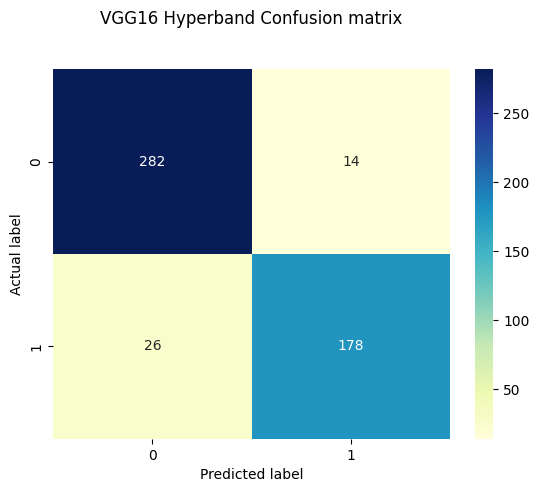

In [79]:
vgg16_hyperband_prediction = vgg16_hyperband.predict(test_data)
cnf_matrix = confusion_matrix(test_labels, np.round(vgg16_hyperband_prediction))

p = sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
plt.title('VGG16 Hyperband Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

print(classification_report(test_labels, np.round(vgg16_hyperband_prediction)))

### RandomSearch

16/16 [==============================] - 1s 71ms/step
              precision    recall  f1-score   support

           0       0.95      0.90      0.93       296
           1       0.86      0.94      0.90       204

    accuracy                           0.91       500
   macro avg       0.91      0.92      0.91       500
weighted avg       0.92      0.91      0.91       500



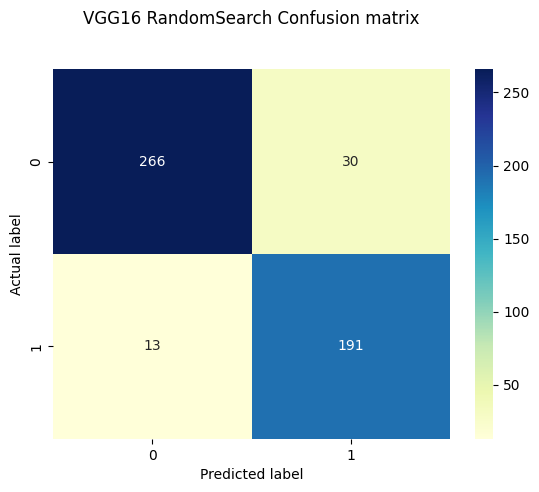

In [80]:
vgg16_randomsearch_prediction = vgg16_randomsearch.predict(test_data)
cnf_matrix = confusion_matrix(test_labels, np.round(vgg16_randomsearch_prediction))

p = sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
plt.title('VGG16 RandomSearch Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

print(classification_report(test_labels, np.round(vgg16_randomsearch_prediction)))

### Bayesian

16/16 [==============================] - 1s 52ms/step
              precision    recall  f1-score   support

           0       0.94      0.93      0.94       296
           1       0.90      0.92      0.91       204

    accuracy                           0.92       500
   macro avg       0.92      0.92      0.92       500
weighted avg       0.92      0.92      0.92       500



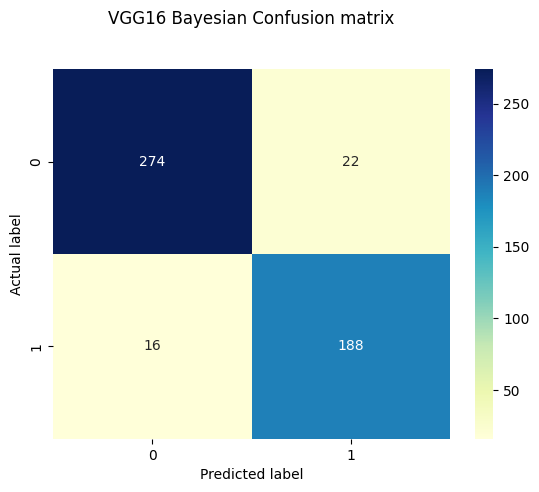

In [81]:
vgg16_bayesian_prediction = vgg16_bayesian.predict(test_data)
cnf_matrix = confusion_matrix(test_labels, np.round(vgg16_bayesian_prediction))

p = sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
plt.title('VGG16 Bayesian Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

print(classification_report(test_labels, np.round(vgg16_bayesian_prediction)))

## Test Prediction

### Hyperband

1/1 [==============================] - 0s 71ms/step


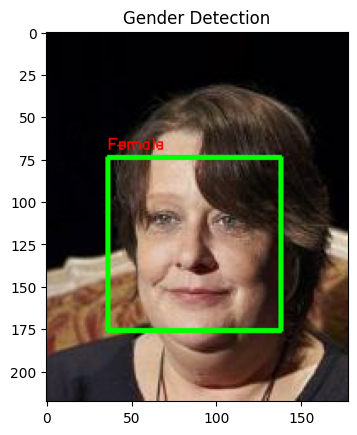

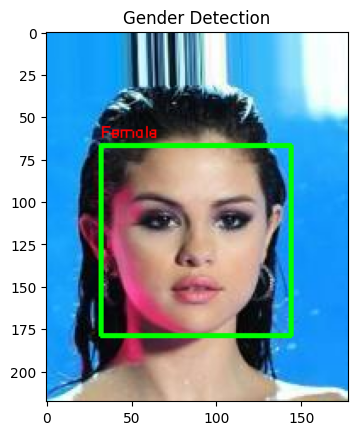

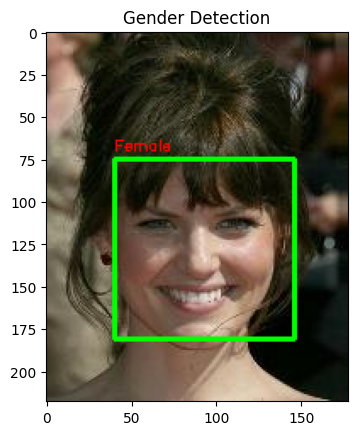

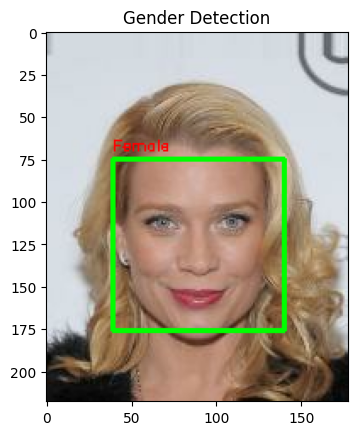

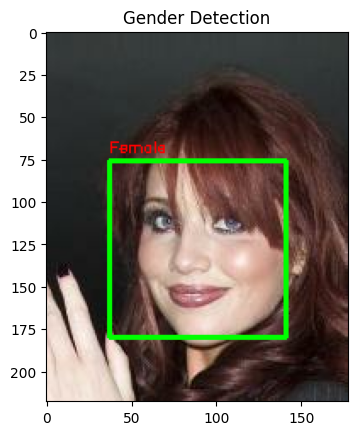

...

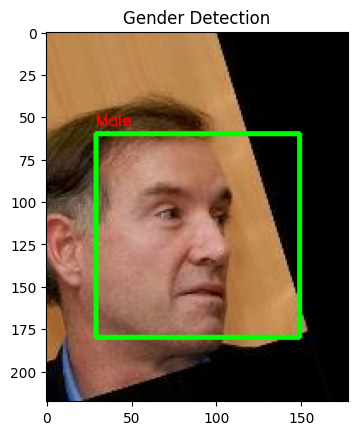

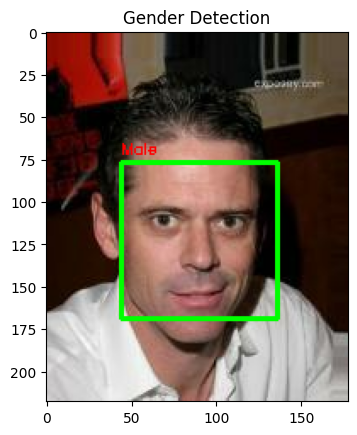

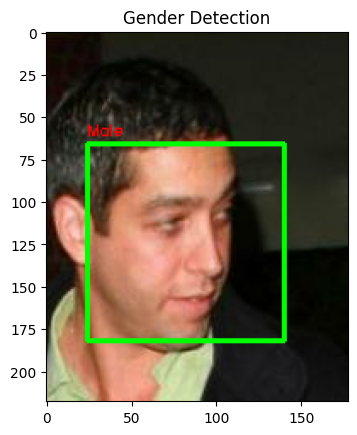

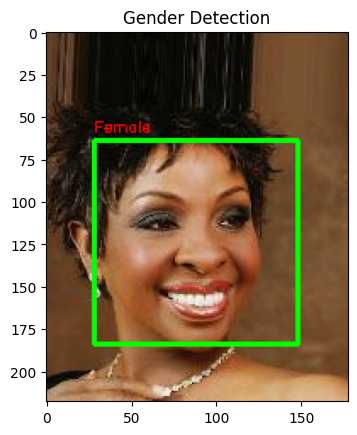

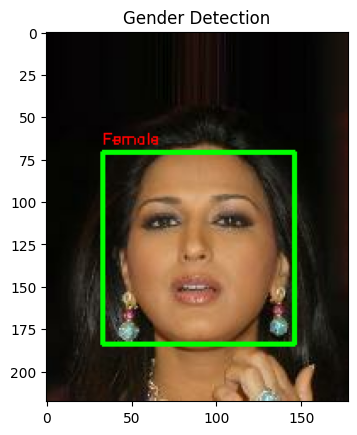

In [82]:
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
for images, labels in test_datasets.take(1):
    predicts = vgg16_hyperband.predict(images)
    for image, predict in zip(images, predicts):
        image = np.array(image, dtype='uint8')
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        faces = face_cascade.detectMultiScale(gray, 1.3, 5)

        for (x, y, w, h) in faces:
            if np.round(predict) == 0:
                cv2.rectangle(image, (x, y),((x + w), (y + h)), (0, 255, 0), 2)
                cv2.putText(image, 'Female', (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (255, 0, 0), 1)
                plt.imshow(image)
                plt.title('Gender Detection')
                plt.show()
            else:
                cv2.rectangle(image, (x, y),((x + w), (y + h)), (0, 255, 0), 2)
                cv2.putText(image, 'Male', (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (255, 0, 0), 1)
                plt.imshow(image)
                plt.title('Gender Detection')
                plt.show()         
    break

### RandomSearch

1/1 [==============================] - 0s 24ms/step


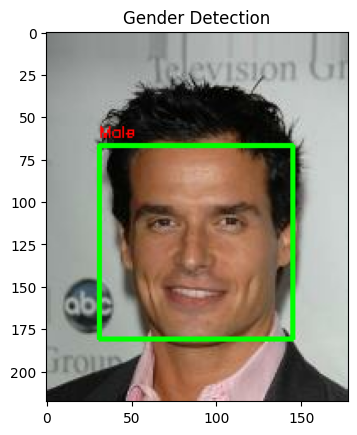

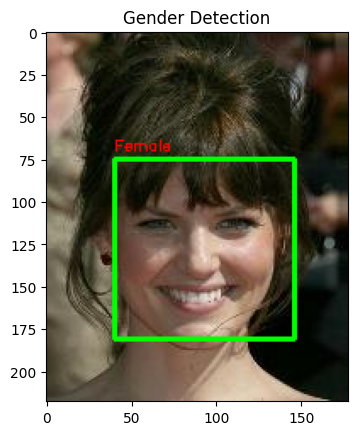

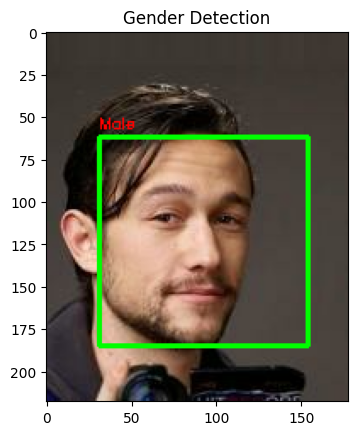

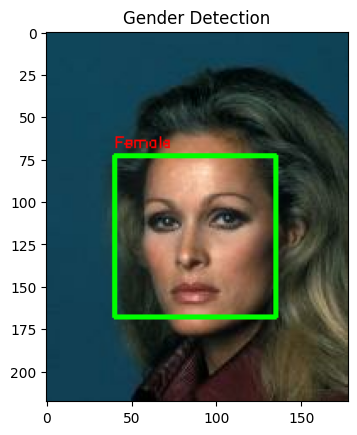

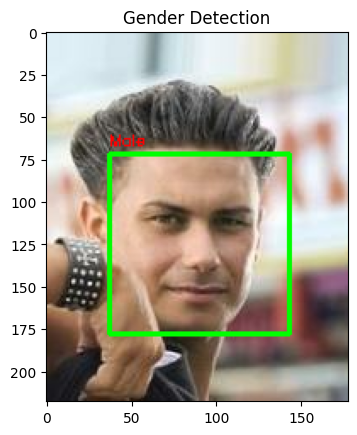

...

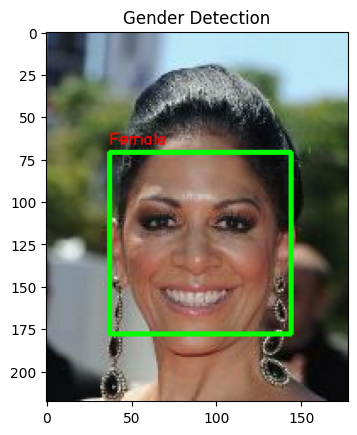

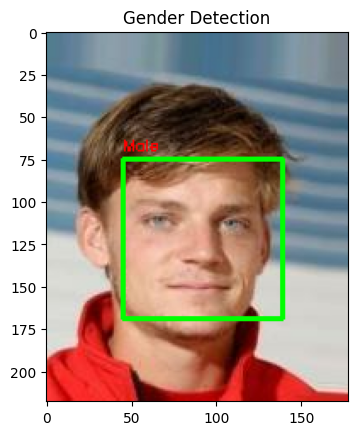

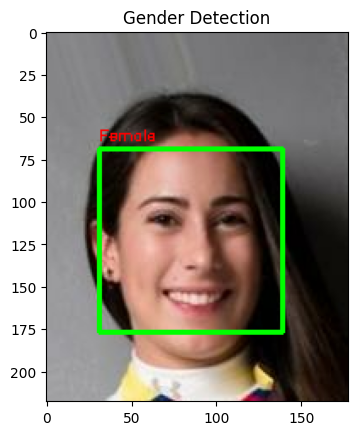

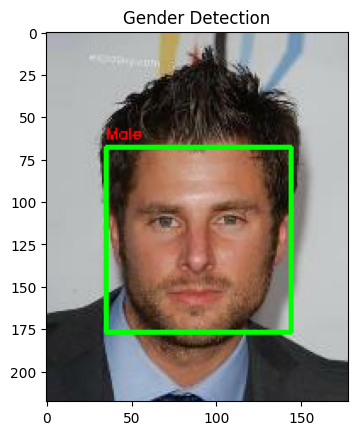

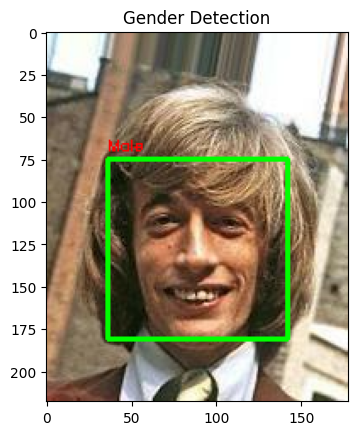

In [83]:
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
for images, labels in test_datasets.take(1):
    predicts = vgg16_randomsearch.predict(images)
    for image, predict in zip(images, predicts):
        image = np.array(image, dtype='uint8')
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        faces = face_cascade.detectMultiScale(gray, 1.3, 5)

        for (x, y, w, h) in faces:
            if np.round(predict) == 0:
                cv2.rectangle(image, (x, y),((x + w), (y + h)), (0, 255, 0), 2)
                cv2.putText(image, 'Female', (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (255, 0, 0), 1)
                plt.imshow(image)
                plt.title('Gender Detection')
                plt.show()
            else:
                cv2.rectangle(image, (x, y),((x + w), (y + h)), (0, 255, 0), 2)
                cv2.putText(image, 'Male', (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (255, 0, 0), 1)
                plt.imshow(image)
                plt.title('Gender Detection')
                plt.show()         
    break

### Bayesian

1/1 [==============================] - 0s 28ms/step


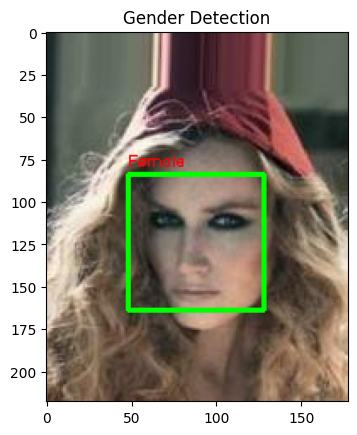

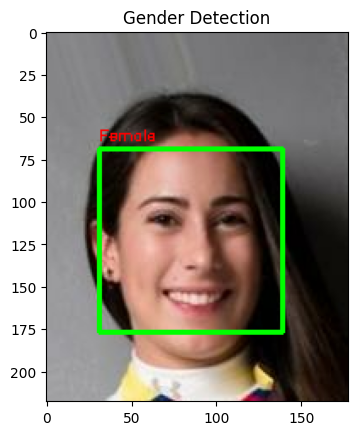

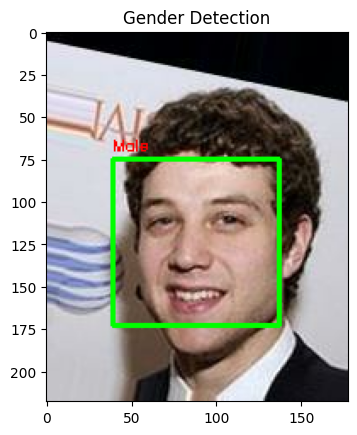

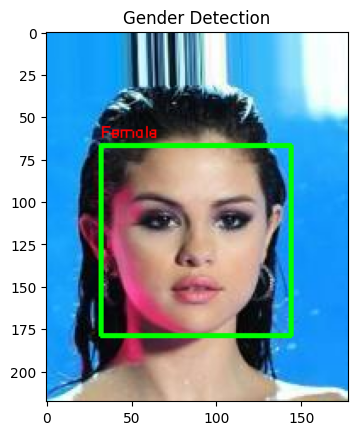

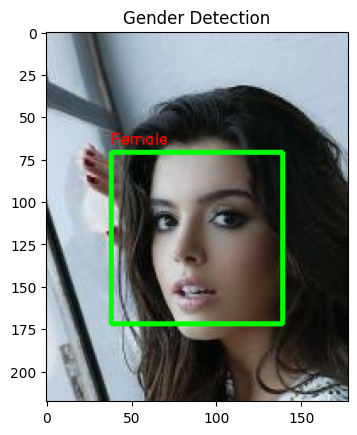

...

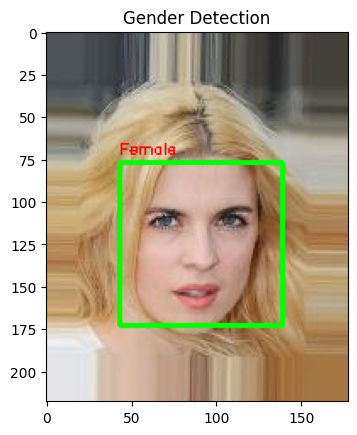

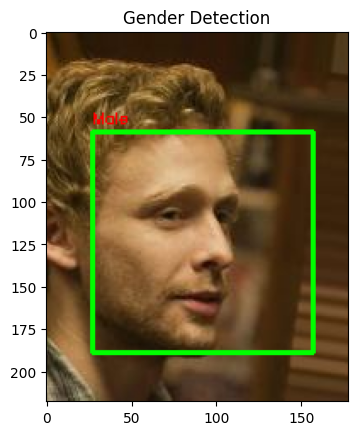

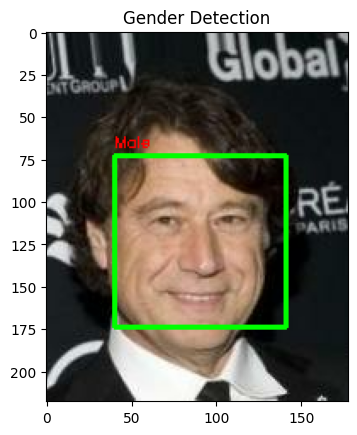

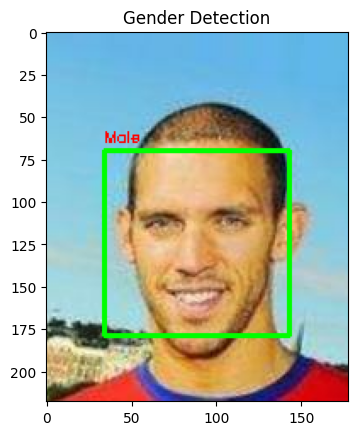

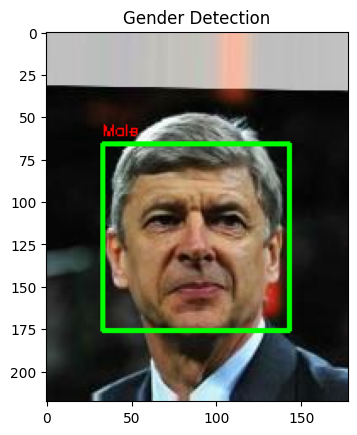

In [84]:
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
for images, labels in test_datasets.take(1):
    predicts = vgg16_bayesian.predict(images)
    for image, predict in zip(images, predicts):
        image = np.array(image, dtype='uint8')
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        faces = face_cascade.detectMultiScale(gray, 1.3, 5)

        for (x, y, w, h) in faces:
            if np.round(predict) == 0:
                cv2.rectangle(image, (x, y),((x + w), (y + h)), (0, 255, 0), 2)
                cv2.putText(image, 'Female', (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (255, 0, 0), 1)
                plt.imshow(image)
                plt.title('Gender Detection')
                plt.show()
            else:
                cv2.rectangle(image, (x, y),((x + w), (y + h)), (0, 255, 0), 2)
                cv2.putText(image, 'Male', (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (255, 0, 0), 1)
                plt.imshow(image)
                plt.title('Gender Detection')
                plt.show()         
    break